In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import model as modellib
import pandas as pd
import cv2
import numpy as np
from inference_config import inference_config
from bowl_dataset import BowlDataset
import visualize
import matplotlib.pyplot as plt
from utils import rle_encode, rle_decode, rle_to_string

%matplotlib inline

/home/r00t/.pyenv/versions/3.6.4/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)
/home/r00t/.pyenv/versions/3.6.4/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.



Configurations:
BACKBONE_SHAPES                [[64 64]
 [32 32]
 [16 16]
 [ 8  8]
 [ 4  4]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  256
IMAGE_MIN_DIM                  256
IMAGE_PADDING                  True
IMAGE_SHAPE                    [256 256   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           bowl
NUM_CLASSES                    2
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAINING         2000
ROI_PO

In [2]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [3]:
ROOT_DIR = os.getcwd()
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()[1]

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

dataset_test = BowlDataset()
dataset_test.load_bowl('stage1_test')
dataset_test.prepare()

sample_submission = pd.read_csv('stage1_sample_submission.csv')

Loading weights from  /home/r00t/dev/bowl/logs/bowl20180301T2329/mask_rcnn_bowl_0100.h5


Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   79.00000
molded_images            shape: (1, 256, 256, 3)      min: -122.70000  max:  -24.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


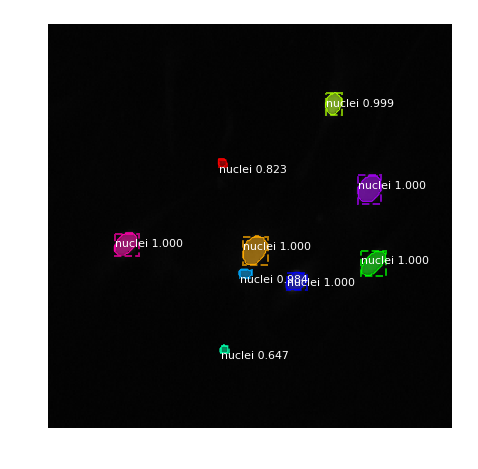

Processing 1 images
image                    shape: (519, 253, 3)         min:   11.00000  max:  242.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  137.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


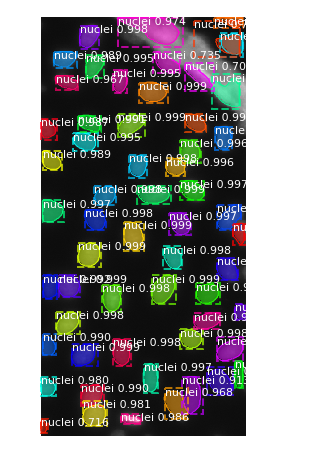

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


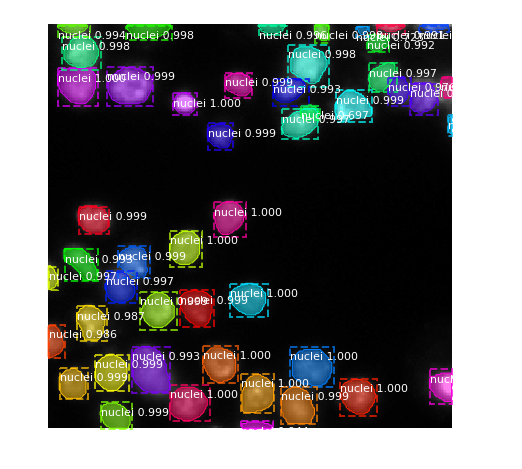

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -114.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


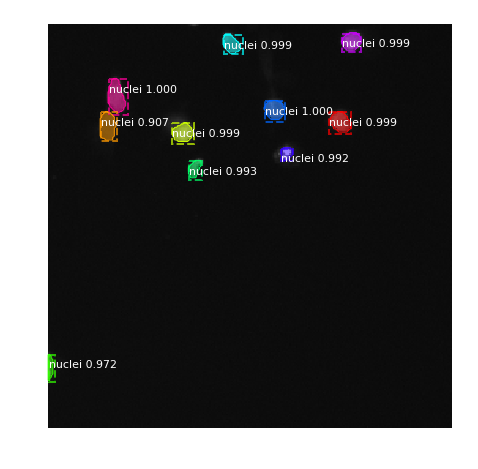

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


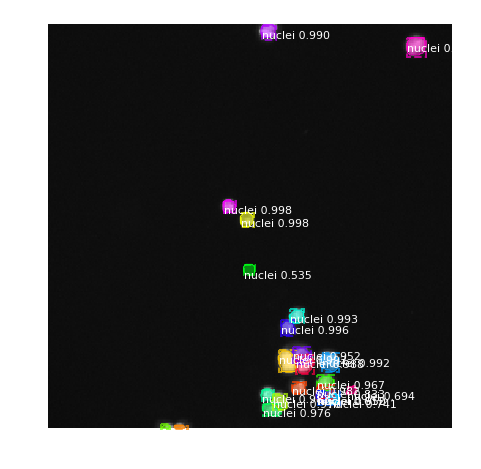

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


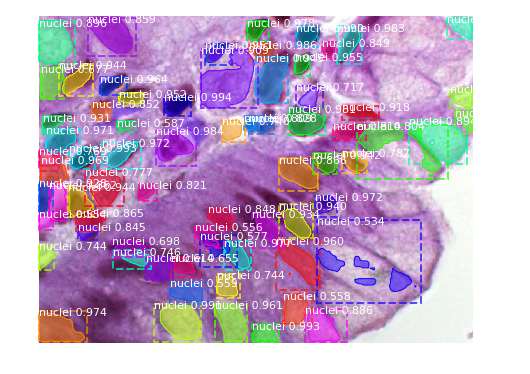

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  192.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   35.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


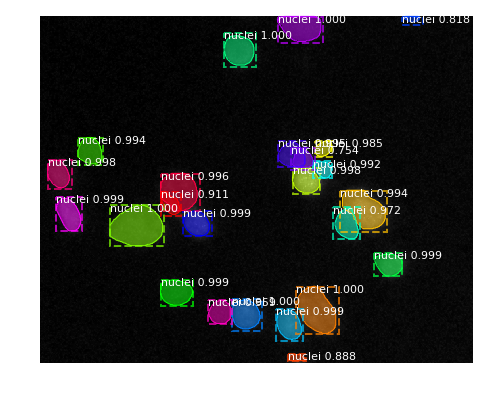

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  144.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


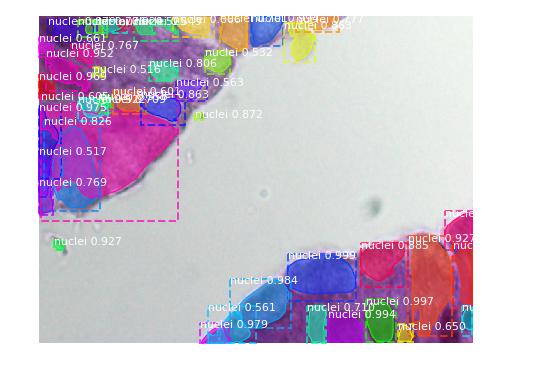

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:   76.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  -34.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


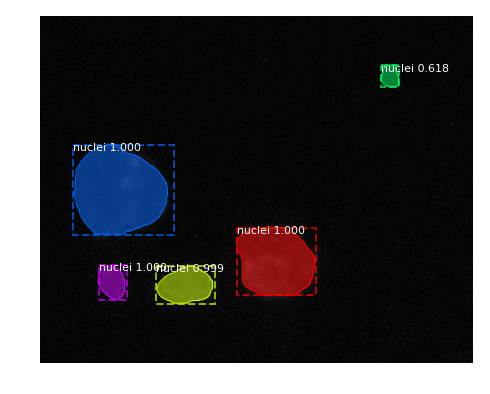

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  108.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:    4.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


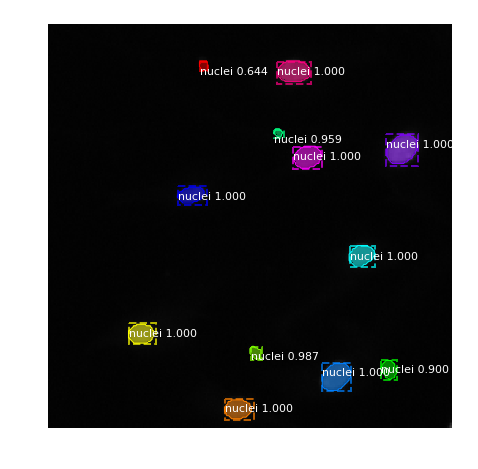

Processing 1 images
image                    shape: (519, 162, 3)         min:    1.00000  max:  205.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   77.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


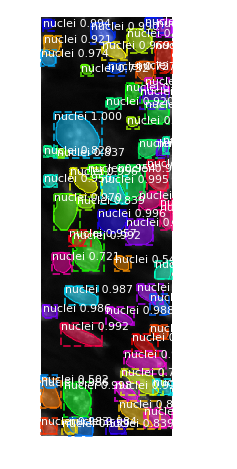

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  126.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:    1.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


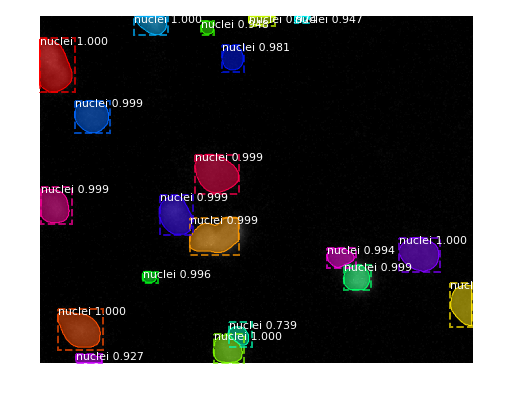

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


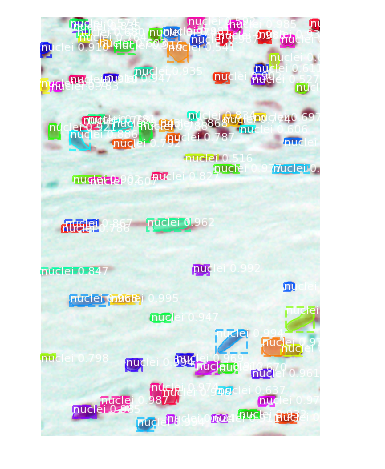

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


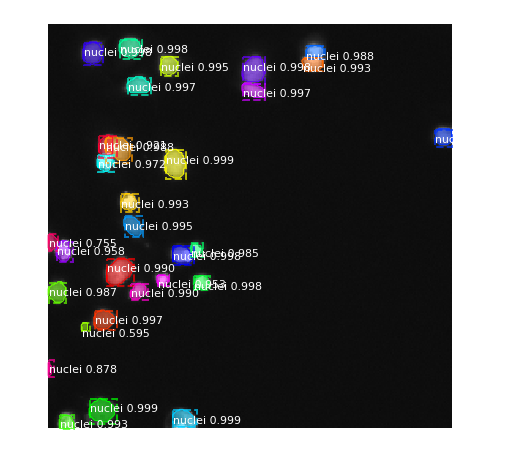

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  144.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


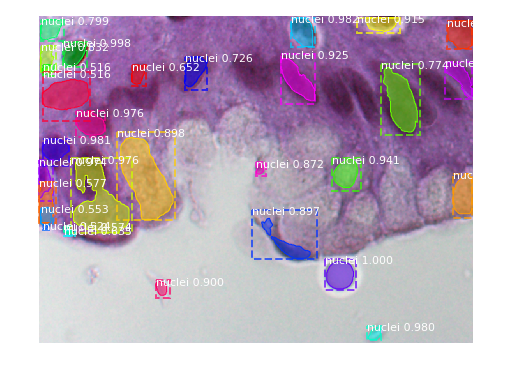

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


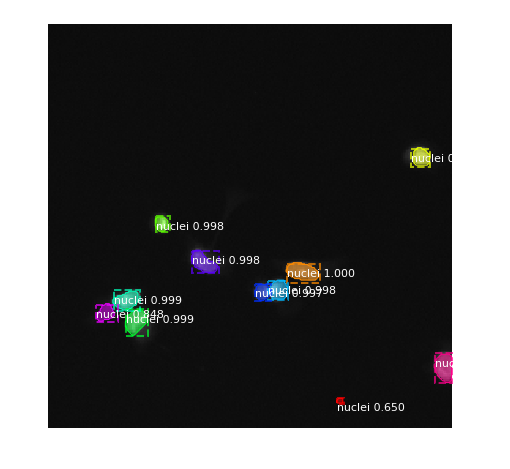

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


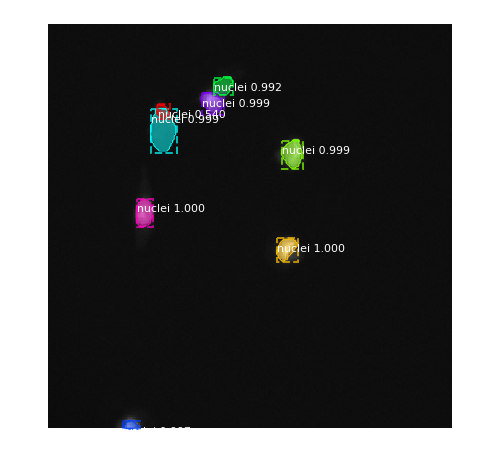

Processing 1 images
image                    shape: (519, 253, 3)         min:   11.00000  max:  211.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  106.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


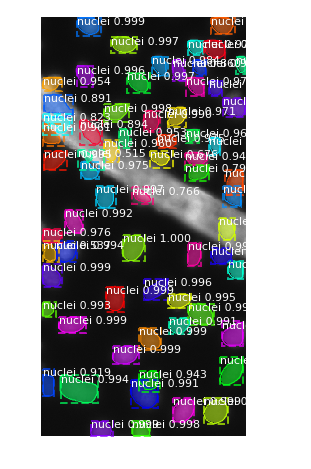

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  101.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   -2.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


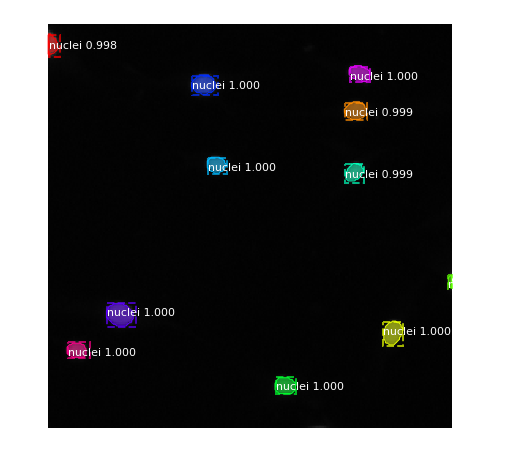

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  149.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


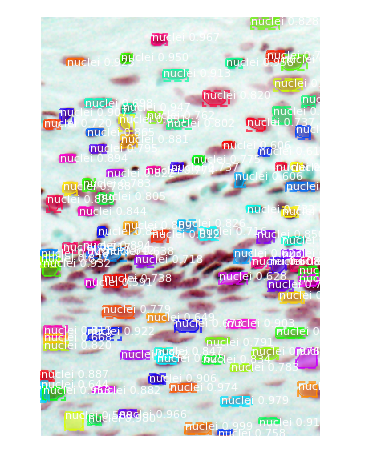

Processing 1 images
image                    shape: (520, 348, 3)         min:    5.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


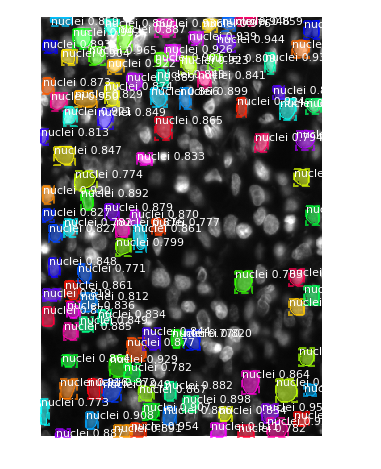

Processing 1 images
image                    shape: (260, 347, 3)         min:    2.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  347.00000


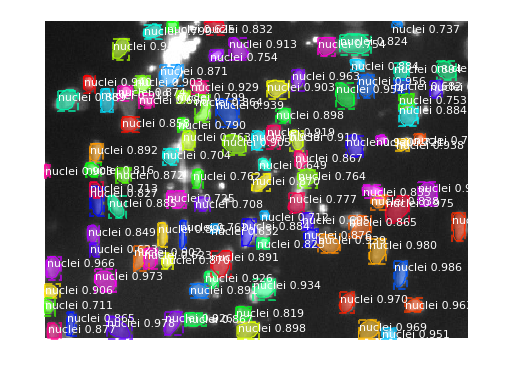

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


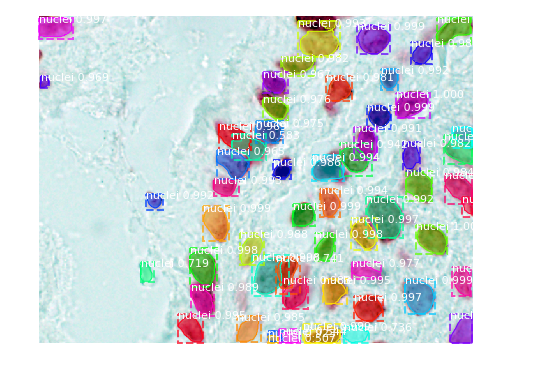

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


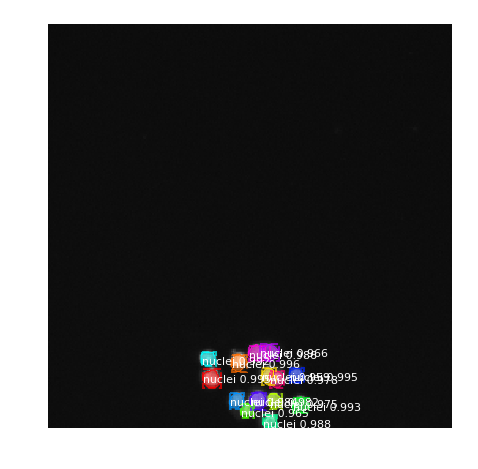

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  149.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


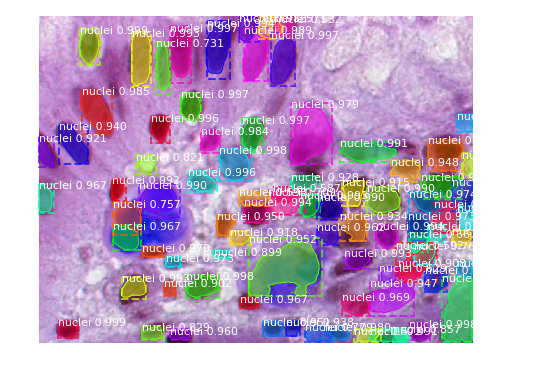

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


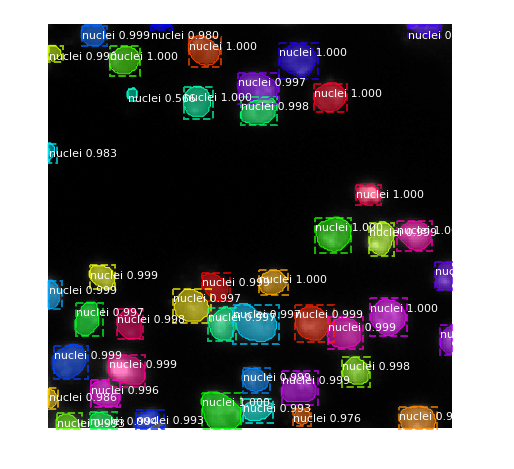

Processing 1 images
image                    shape: (390, 239, 3)         min:    0.00000  max:   81.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  -26.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  390.00000


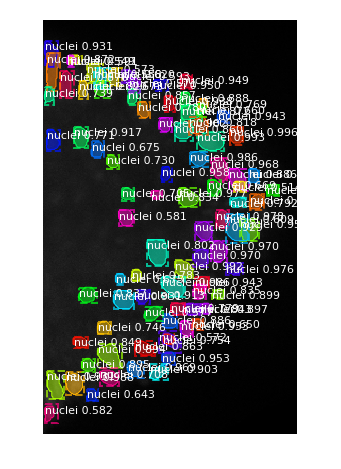

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  109.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  -16.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


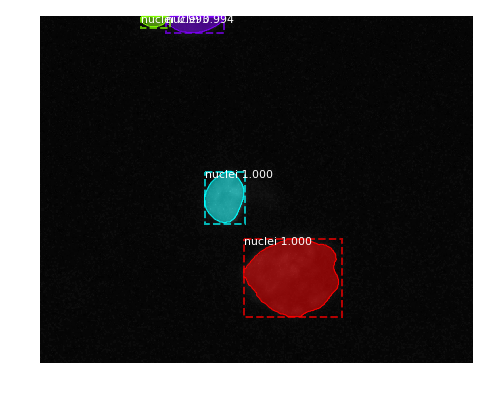

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:  121.00000
molded_images            shape: (1, 256, 256, 3)      min: -122.70000  max:   17.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


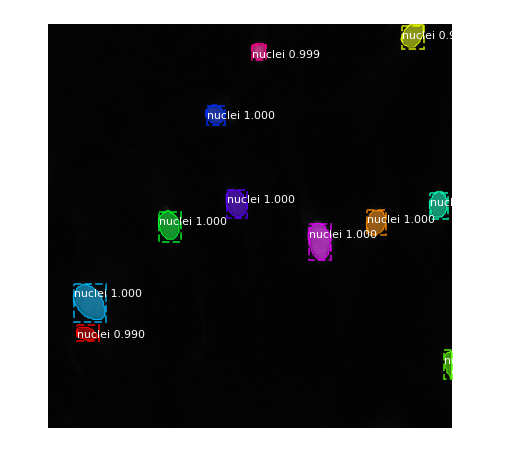

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -114.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


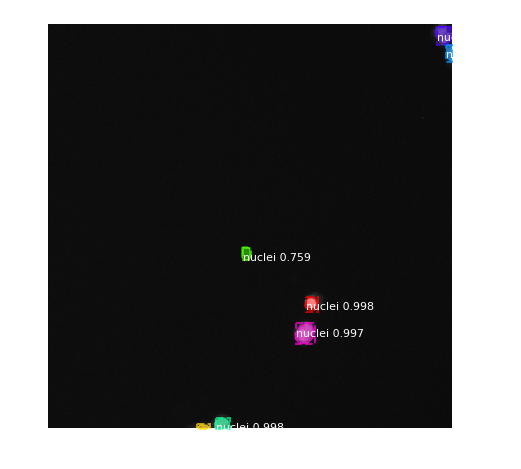

Processing 1 images
image                    shape: (260, 347, 3)         min:   26.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  347.00000


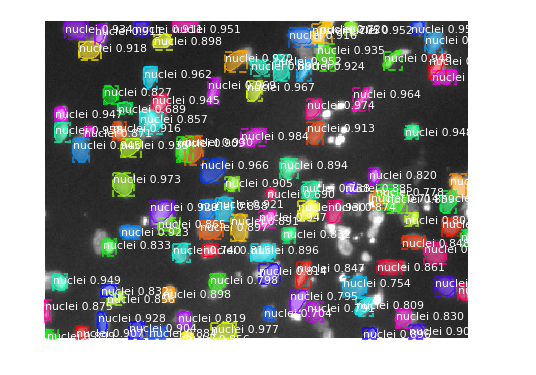

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   93.00000
molded_images            shape: (1, 256, 256, 3)      min: -122.70000  max:  -10.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


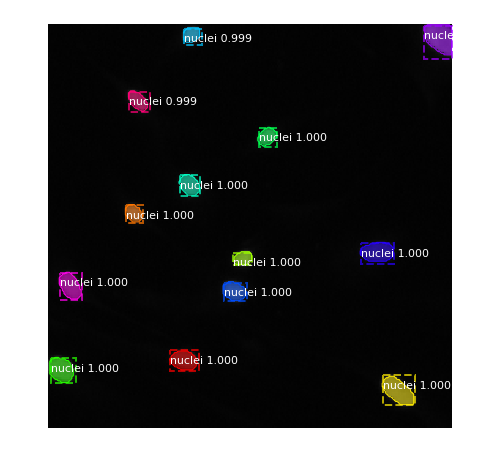

Processing 1 images
image                    shape: (520, 348, 3)         min:    3.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


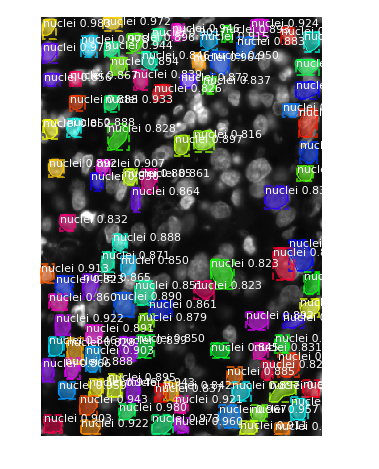

Processing 1 images
image                    shape: (512, 640, 3)         min:    1.00000  max:  153.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   23.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


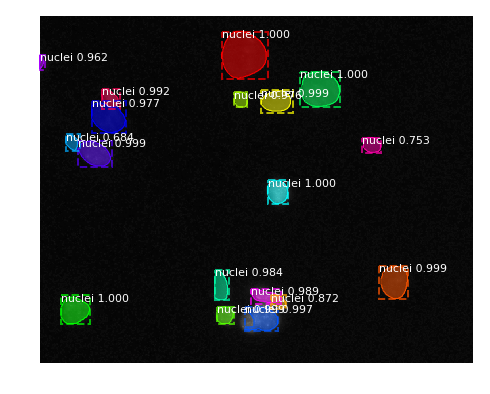

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -114.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


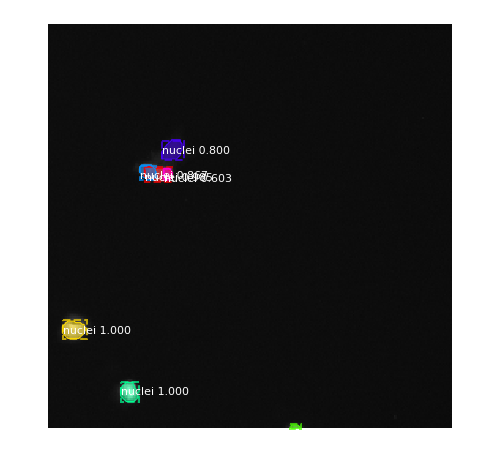

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


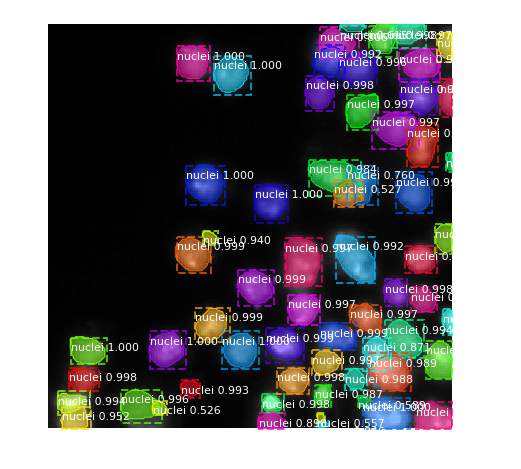

Processing 1 images
image                    shape: (260, 347, 3)         min:   28.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  347.00000


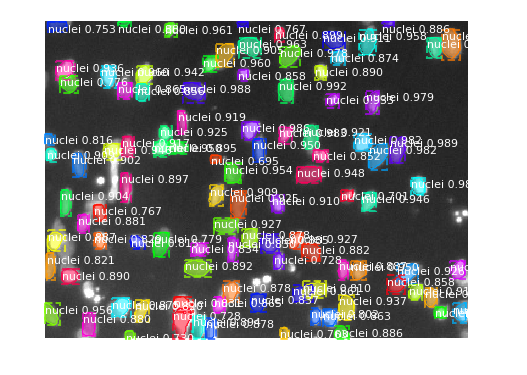

Processing 1 images
image                    shape: (520, 348, 3)         min:    3.00000  max:  186.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   75.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


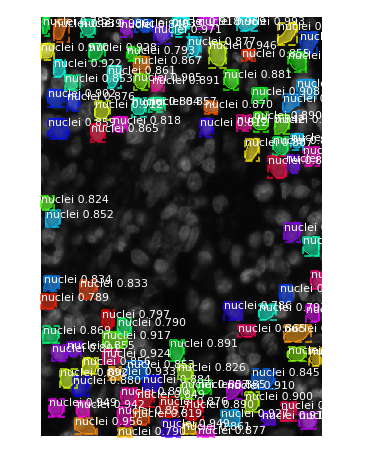

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  177.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   39.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


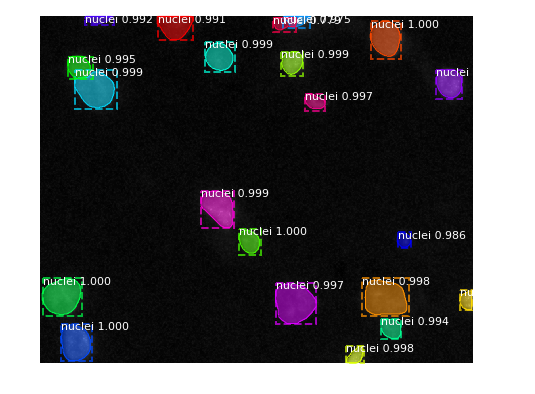

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  245.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  141.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


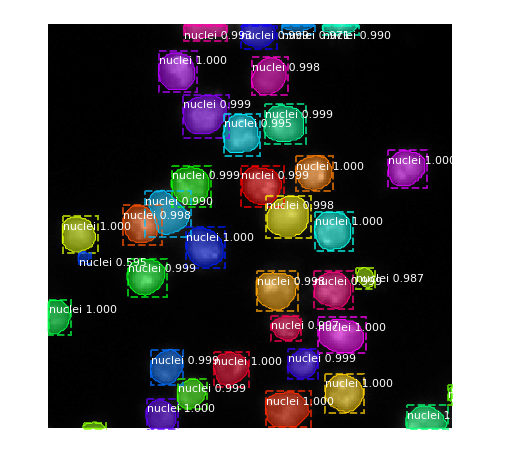

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  186.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   56.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


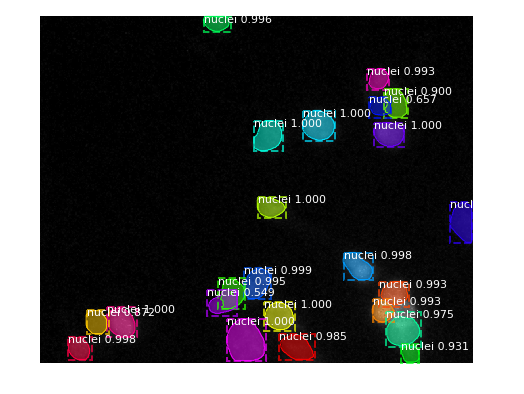

Processing 1 images
image                    shape: (520, 696, 3)         min:   10.00000  max:  237.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  132.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


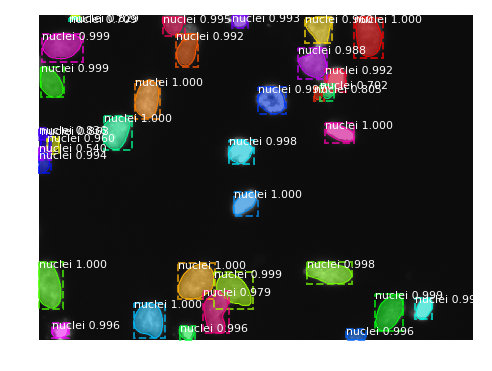

Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -113.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


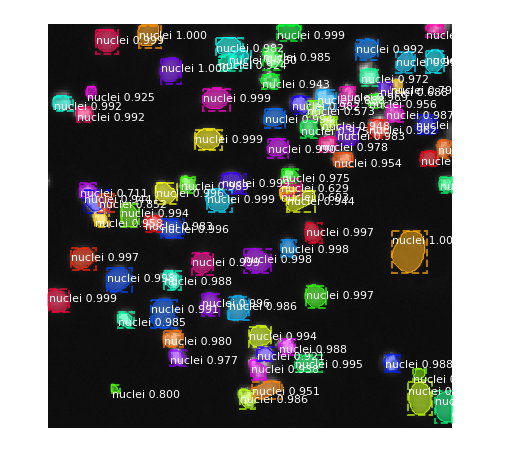

Processing 1 images
image                    shape: (512, 640, 3)         min:    0.00000  max:  109.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  -14.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  640.00000


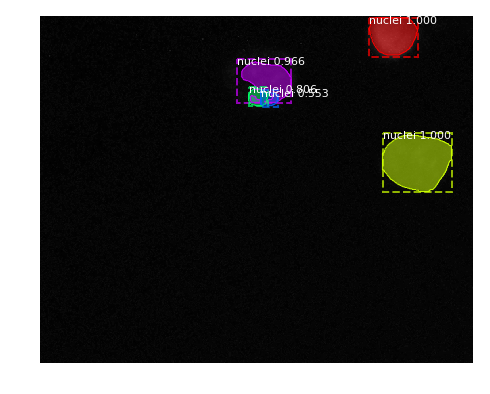

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  150.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


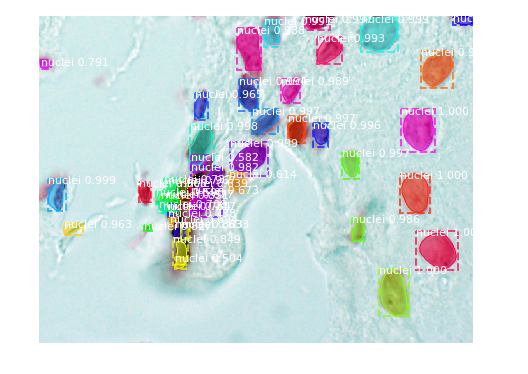

Processing 1 images
image                    shape: (519, 253, 3)         min:    9.00000  max:  101.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   -9.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


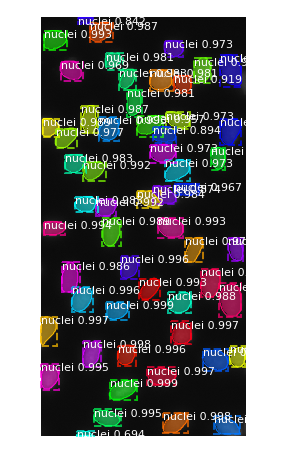

Processing 1 images
image                    shape: (519, 161, 3)         min:    5.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


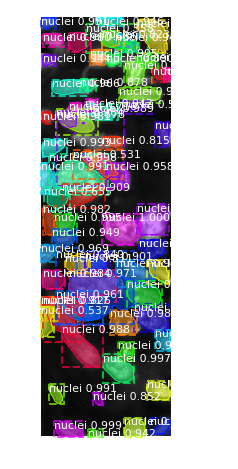

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:   89.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  -14.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


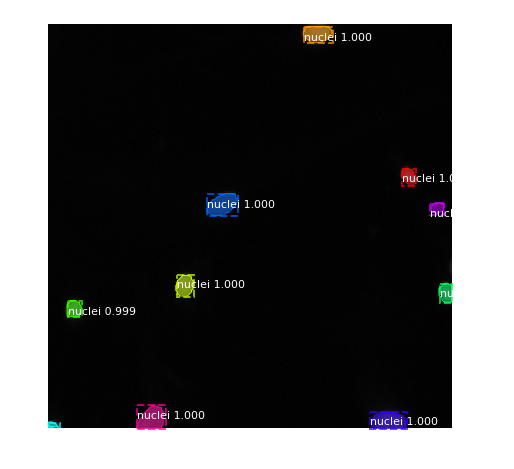

Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  225.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  119.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


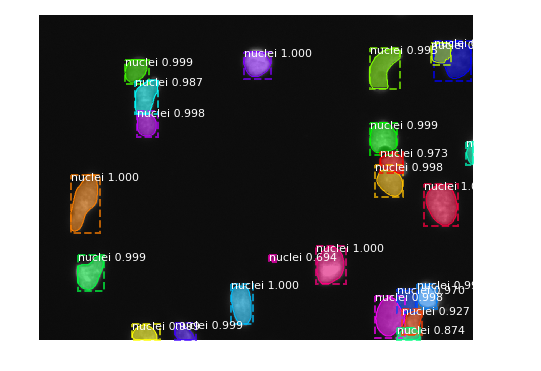

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  253.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  145.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


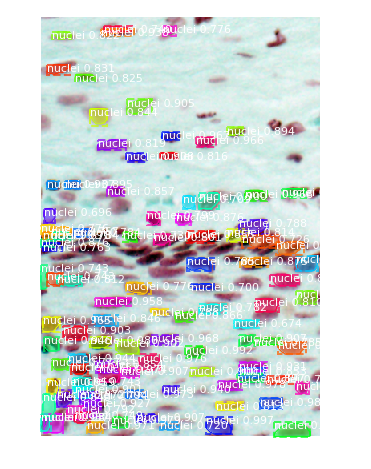

Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  230.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  125.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


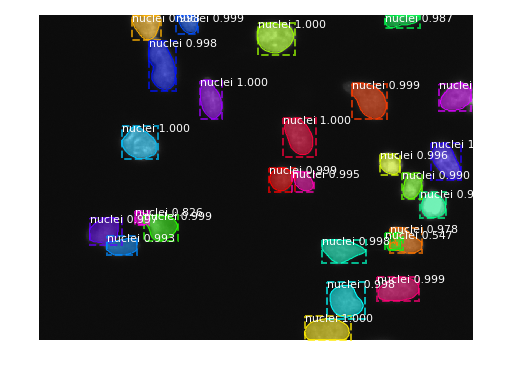

Processing 1 images
image                    shape: (524, 348, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  149.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  524.00000


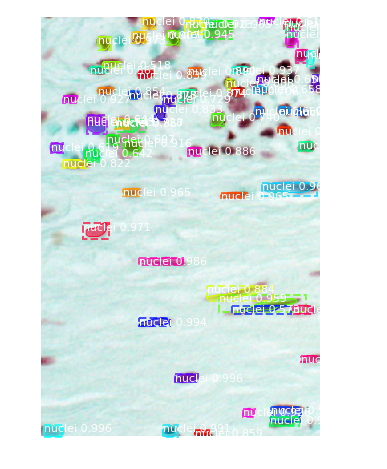

Processing 1 images
image                    shape: (519, 161, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


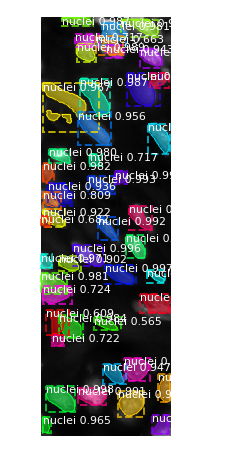

Processing 1 images
image                    shape: (519, 162, 3)         min:    3.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


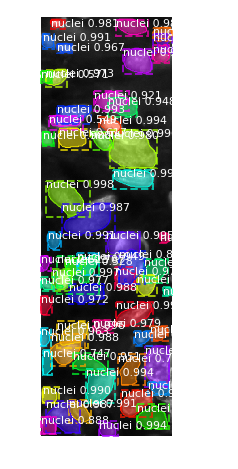

Processing 1 images
image                    shape: (520, 348, 3)         min:    0.00000  max:  201.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   81.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  520.00000


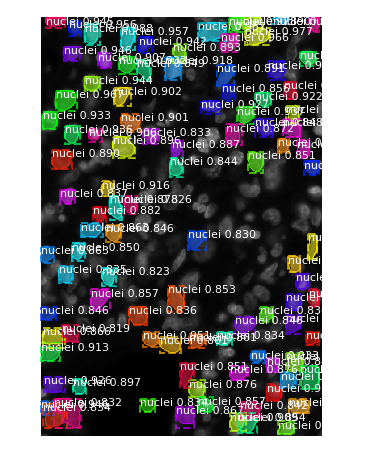

Processing 1 images
image                    shape: (256, 256, 3)         min:    8.00000  max:  192.00000
molded_images            shape: (1, 256, 256, 3)      min: -115.70000  max:   88.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


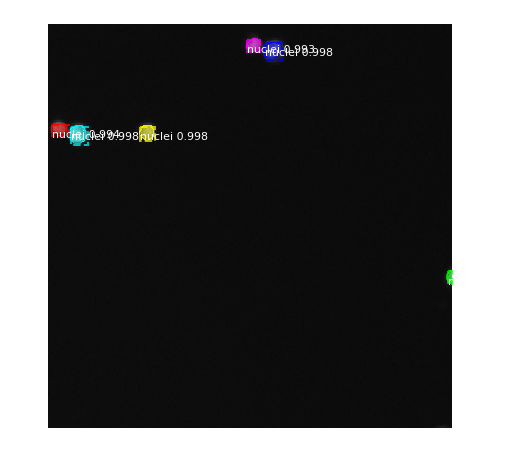

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


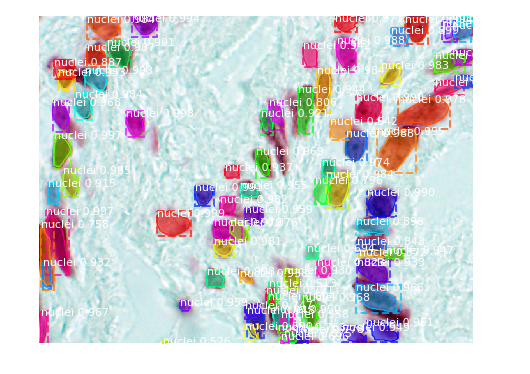

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   95.00000
molded_images            shape: (1, 256, 256, 3)      min: -122.70000  max:   -8.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


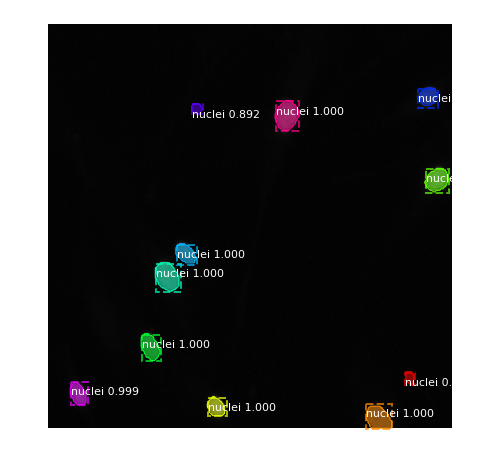

Processing 1 images
image                    shape: (260, 347, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  347.00000


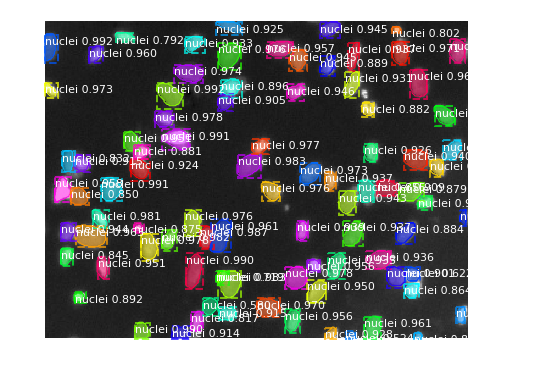

Processing 1 images
image                    shape: (256, 256, 3)         min:    1.00000  max:   82.00000
molded_images            shape: (1, 256, 256, 3)      min: -122.70000  max:  -21.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


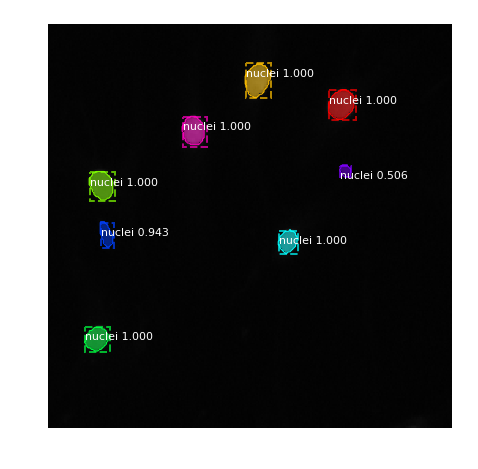

Processing 1 images
image                    shape: (519, 253, 3)         min:   10.00000  max:  225.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  119.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  519.00000


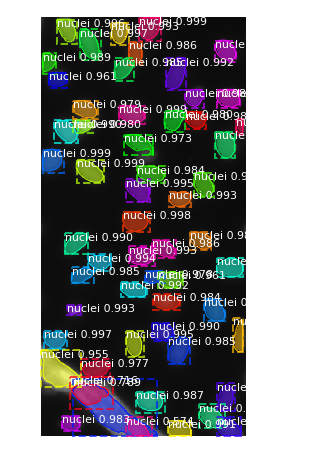

Processing 1 images
image                    shape: (520, 696, 3)         min:   11.00000  max:  222.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  116.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  696.00000


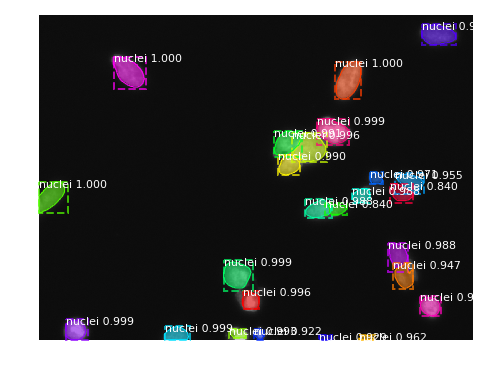

Processing 1 images
image                    shape: (512, 680, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  680.00000


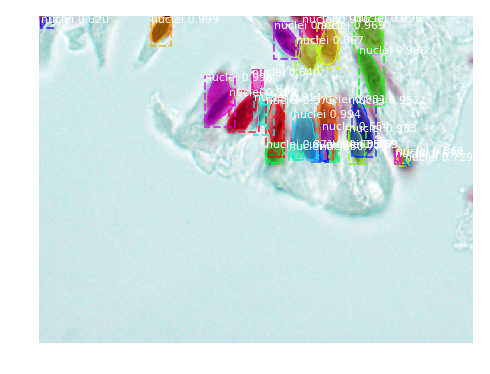

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -114.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


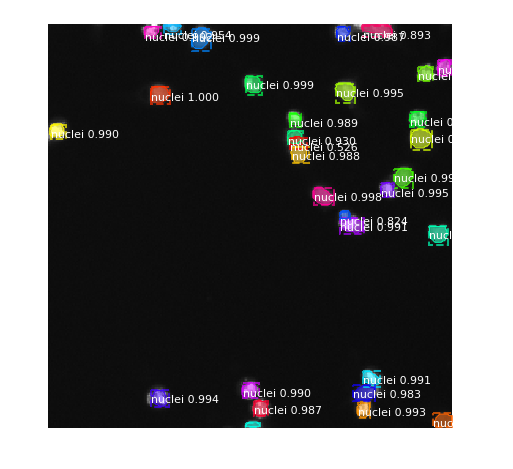

Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -114.70000  max:  151.10000
image_metas              shape: (1, 10)               min:    0.00000  max:  256.00000


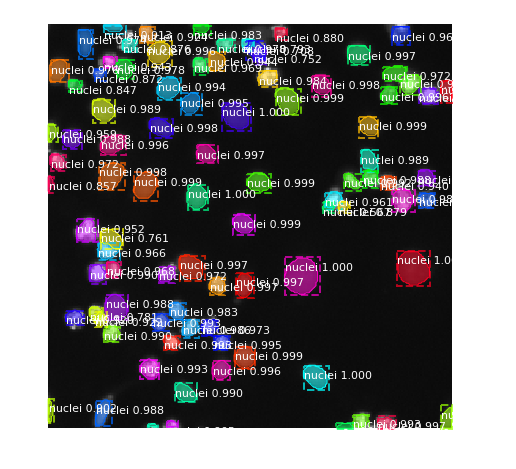

In [5]:
output = []

for image_id in sample_submission.ImageId:
    image_path = os.path.join('stage1_test', image_id, 'images', image_id + '.png')
    
    original_image = cv2.imread(image_path)
    results = model.detect([original_image], verbose=1)
    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                ['', 'nuclei'], r['scores'], ax=get_ax())

# Hs stuff from test_submission_for_errors

In [ ]:
def test_image(df, image_id, plot=False):
    image = cv2.imread('stage1_test/' + image_id + '/images/' + image_id + '.png')
    shape = image.shape[:2]
    for rle in df[df.ImageId == image_id].EncodedPixels:
        try:
            decoded_result = rle_decode(rle, shape)
            plt.figure()
            plt.imshow(image)
            plt.figure()
            plt.imshow(decoded_result)
        except Exception as e:
            print(e)
            print(image_id)
            print('---')

In [ ]:
df = pd.read_csv('submission.csv')
df.head()

In [ ]:
for image_id in df.ImageId.unique()[50:51]:
    test_image(df, image_id)